Dimensionality Reduction to Compare Neural Population Responses to Pure Tone Stimuli in the Auditory Cortex of Mice with Age-Related Hearing Loss and Genetically-Restored Hearing 
\
\
Sean Sebastian Darcy, Johns Hopkins Biomedical Engineering Class of 2023

Imports

In [2]:
import numpy as np
from pymatreader import read_mat
from torchvision.transforms import ToTensor
from pathlib import Path
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler, MinMaxScaler
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from scipy.ndimage.filters import gaussian_filter1d
import warnings
warnings.filterwarnings("ignore")
from matplotlib.lines import Line2D
from matplotlib import animation 
from IPython.display import HTML

/var/folders/sk/_fl9rzxj6w382hgh6y1sdncr0000gn/T/ipykernel_48778/2265581136.py:10: DeprecationWarning: Please use `gaussian_filter1d` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  from scipy.ndimage.filters import gaussian_filter1d


Load 2-Photon Data

In [3]:
mice = ['m1315', 'm1318', 'm1321', 'm1323']
dFs = []
dFs2 = [] #specify a second time point

for mouse in mice :
    print("Mouse:", mouse)
    print("Loading data...")
    Fl = np.load(Path("/Volumes/Data2/Travis/Cdh23/Cdh23 Data", mouse, "2P/L23/221205/suite2p/plane0/F.npy"), allow_pickle=True)
    Fneu = np.load(Path("/Volumes/Data2/Travis/Cdh23/Cdh23 Data", mouse, "2P/L23/221205/suite2p/plane0/Fneu.npy"), allow_pickle=True)
    isCell = np.load(Path("/Volumes/Data2/Travis/Cdh23/Cdh23 Data", mouse, "2P/L23/221205/suite2p/plane0/iscell.npy"), allow_pickle=True)
    print("Calculating dF...")
    dF = Fl - (0.7*Fneu)
    print(dF.shape)
    dF = np.take(dF, np.where(isCell == 1)[0], axis = 0)
    print(dF.shape)
    dFs.append(dF)

    #get second time point
    if mouse == 'm1321' or mouse == 'm1318' :
        print("Mouse:", mouse)
        print("Loading data...")
        Fl = np.load(Path("/Volumes/Data2/Travis/Cdh23/Cdh23 Data", mouse, "2P/L23/221218/suite2p/plane0/F.npy"), allow_pickle=True)
        Fneu = np.load(Path("/Volumes/Data2/Travis/Cdh23/Cdh23 Data", mouse, "2P/L23/221218/suite2p/plane0/Fneu.npy"), allow_pickle=True)
        isCell = np.load(Path("/Volumes/Data2/Travis/Cdh23/Cdh23 Data", mouse, "2P/L23/221218/suite2p/plane0/iscell.npy"), allow_pickle=True)
        print("Calculating dF...")
        dF = Fl - (0.7*Fneu)
        print(dF.shape)
        dF = np.take(dF, np.where(isCell == 1)[0], axis = 0)
        print(dF.shape)
        dFs2.append(dF)
        

Mouse: m1315
Loading data...
Calculating dF...
(2557, 14000)
(1560, 14000)
Mouse: m1318
Loading data...
Calculating dF...
(2733, 14000)
(1649, 14000)
Mouse: m1318
Loading data...
Calculating dF...
(2012, 14000)
(1129, 14000)
Mouse: m1321
Loading data...
Calculating dF...
(2584, 14000)
(1518, 14000)
Mouse: m1321
Loading data...
Calculating dF...
(1803, 14000)
(963, 14000)
Mouse: m1323
Loading data...
Calculating dF...
(4105, 14000)
(1551, 14000)


In [151]:
stimID = read_mat(Path("/Volumes/Data2/Travis/Cdh23/Cdh23 Data/m1321/2P/L23/221205/sound_file_2022-12-05_10-58-16_fullmap_1321.mat"))['stimPlayedID']
atten = read_mat(Path("/Volumes/Data2/Travis/Cdh23/Cdh23 Data/m1321/2P/L23/221205/sound_file_2022-12-05_10-58-16_fullmap_1321.mat"))['stimPlayedAtten']
onFrame = read_mat(Path("/Volumes/Data2/Travis/Cdh23/Cdh23 Data/m1321/2P/L23/221205/sound_file_2022-12-05_10-58-16_fullmap_1321.mat"))['stimOnFrame']


stimHistory = np.array([stimID, atten, onFrame], dtype=int)
stimHistory = stimHistory.T


print(stimHistory)

[[    5     0   151]
 [    2    60   219]
 [    4    20   287]
 [    2     0   355]
 [    4    60   423]
 [    4    20   491]
 [    4    40   559]
 [    4    40   627]
 [    2    40   695]
 [    3     0   763]
 [    3     0   831]
 [    1     0   899]
 [    4    40   967]
 [    5    20  1035]
 [    2    40  1103]
 [    2    60  1171]
 [    4    60  1239]
 [    5    20  1307]
 [    4    60  1375]
 [    4    20  1443]
 [    5    60  1511]
 [    2    20  1579]
 [    4    40  1647]
 [    1    40  1715]
 [    2    40  1783]
 [    5     0  1851]
 [    2    60  1919]
 [    1    20  1987]
 [    4    60  2055]
 [    3    60  2123]
 [    2    60  2191]
 [    5    20  2259]
 [    3    20  2327]
 [    3    40  2395]
 [    1    40  2463]
 [    4    40  2531]
 [    4    20  2599]
 [    5    40  2667]
 [    2    20  2735]
 [    1    20  2803]
 [    3    20  2871]
 [    5     0  2939]
 [    1    60  3007]
 [    1    60  3075]
 [    1    40  3143]
 [    5    60  3211]
 [    2    60  3279]
 [    2    60

Load stimHistory objects and sort by stim

In [152]:
stimHistories = []
stimHistories2 = []

for mouse in mice :
    print("Mouse:", mouse)
    print("Loading data...")
    stimHistories.append(read_mat(Path("/Volumes/Data2/Travis/Cdh23/Cdh23 Data", mouse, "2P/L23/221205/suite2p/stimHist.mat"))['stimHistory'])
    if mouse == 'm1321' or mouse == 'm1318' :
        print("Mouse:", mouse)
        print("Loading data...")
        stimHistories2.append(read_mat(Path("/Volumes/Data2/Travis/Cdh23/Cdh23 Data", mouse, "2P/L23/221218/suite2p/stimHist.mat"))['stimHistory'])

stimHistories = np.array(stimHistories)
stimHistories2 = np.array(stimHistories2)
        
for i, k in enumerate(stimHistories) :
    stimHistories[i] =   stimHistories[i][np.lexsort((stimHistories[i][:,2], stimHistories[i][:,1],stimHistories[i][:,0]))]

for i, k in enumerate(stimHistories2) :
    stimHistories2[i] =   stimHistories2[i][np.lexsort((stimHistories2[i][:,2], stimHistories2[i][:,1],stimHistories2[i][:,0]))]
    
print(stimHistories)

Mouse: m1315
Loading data...
Mouse: m1318
Loading data...
Mouse: m1318
Loading data...
Mouse: m1321
Loading data...
Mouse: m1321
Loading data...
Mouse: m1323
Loading data...
[[[    1     0  3551]
  [    1     0  4299]
  [    1     0  5115]
  ...
  [    5    60 11915]
  [    5    60 13003]
  [    5    60 13411]]

 [[    1     0   967]
  [    1     0  2123]
  [    1     0  3415]
  ...
  [    5    60  9943]
  [    5    60 12051]
  [    5    60 13139]]

 [[    1     0   899]
  [    1     0  4707]
  [    1     0  4911]
  ...
  [    5    60  7971]
  [    5    60 11371]
  [    5    60 12051]]

 [[    1     0  1579]
  [    1     0  2871]
  [    1     0  3211]
  ...
  [    5    60  9671]
  [    5    60 12119]
  [    5    60 13479]]]


Order the data and baseline correct

(1560, 68)


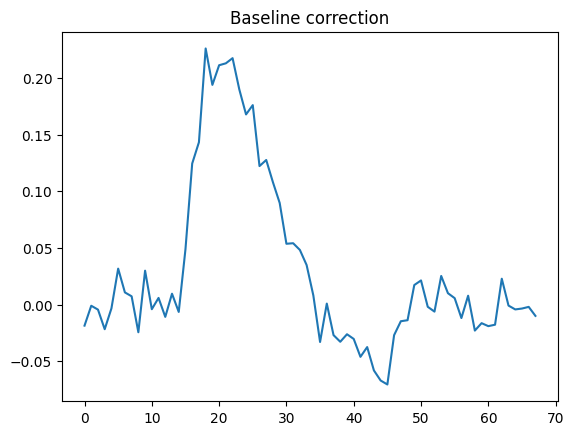

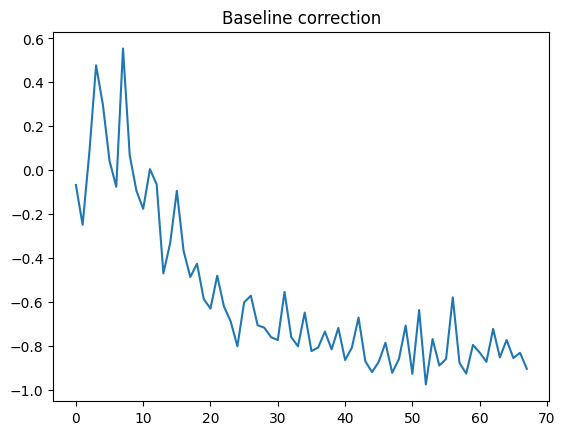

In [5]:
#this creates a data structure indexed by (LIST of mice(2), TENSOR of [tone(5), atten(4), rep(10), frames(88)])
noBLorderedData = []
#skip last mouse that has concatenated data
for mouse in range(len(mice)) : 
    for stim in range(len(stimHistories[mouse])) :
        start = stimHistories[mouse][stim][2] - 15 #1 sec prior (15 frames per sec??)
        end = stimHistories[mouse][stim][2] +  53 #stim and some change
        noBLorderedData.append(ToTensor()(dFs[mouse][:, start:end]))

##BASELINE CORRECTED
orderedData= []
t2 = []

#skip last mouse that has concatenated data
for mouse in range(len(mice)) :
    #Fo = np.mean(dFs[mouse][:, 0:150])
    #print("Fo:", Fo)
    for stim in range(len(stimHistories[mouse])) :
        #start = stimHistories[mouse][stim][2] - 8 #one sec prior (16 frames per sec??)
        start = stimHistories[mouse][stim][2] - 15 #2 seconds before (151 gets you back to index 150
        #print(start)
        end = stimHistories[mouse][stim][2] + 53 #3.5 secs after
        #print(end)
        Fo = np.mean(dFs[mouse][:, start :start + 15], 1) #have to shift mouse data
        orderedData.append((((dFs[mouse][:, start:end].T) - Fo) / Fo).T) #have to shift mouse data
    if mouse == 1 or mouse == 2 :
        for stim in range(len(stimHistories2[mouse - 1])) :
            start = stimHistories2[mouse - 1][stim][2] - 15 #2 seconds before (151 gets you back to index 150)
            end = stimHistories2[mouse - 1][stim][2] + 53 #3.5 secs after
            Fo = np.mean(dFs2[mouse - 1][:, start :start + 15], 1) #have to shift mouse data
            t2.append((((dFs2[mouse - 1][:, start:end].T) - Fo) / Fo).T)

                
print(orderedData[0].shape)
#tensor of mouse 3, stim 80,

#plt.figure()
#plt.title("No baseline correction")
#plt.plot(noBL[6, :])

plt.figure()
plt.title("Baseline correction")
#plt.plot(orderedData[0][9][:])
plt.plot(np.mean(orderedData[100][:][:], axis = 0))



plt.figure()
plt.title("Baseline correction")
plt.plot(t2[0][9][:])



Mean Population Traces

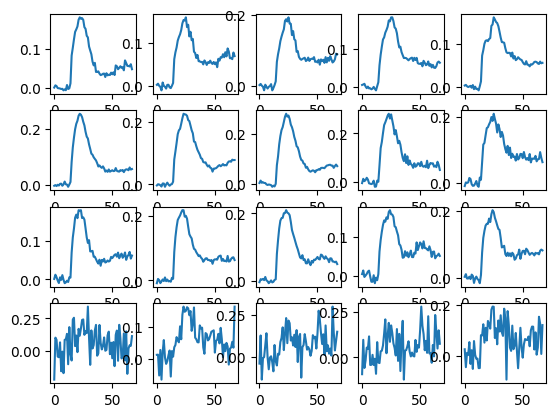

In [33]:
plt.figure

counter = 1
for i in range(len(mice)) :
    for tones in range (5) :
        start = 20*tones
        end= 20*tones + 39
        meanResponse = np.mean(np.mean(orderedData[200*i + start:200*i + end],axis = 0), axis=0)
        plt.subplot(4, 5, counter)
        plt.plot(meanResponse)
        counter =  counter + 1


Define utility functions

In [34]:
def z_score(X):
    # X: ndarray, shape (n_features, n_samples)
    ss = StandardScaler(with_mean=True, with_std=True)
    Xz = ss.fit_transform(X.T).T
    return Xz

X = np.array([[5., 6., 5.],
              [50., 60., 50.]]) # data array of shape n_neuron by n_time_points
X = z_score(X)
c = np.cov(X, rowvar=True) # covariance matrix
eig_vals, eig_vecs = np.linalg.eig(c)
srt = np.argsort(eig_vals)[::-1]
print('Sorted eigenvalues: \n{}'.format(eig_vals[srt]))
print('\nFirst eigenvector: \n{}'.format(eig_vecs[:, srt][:, 0]))

Sorted eigenvalues: 
[3. 0.]

First eigenvector: 
[0.70710678 0.70710678]


Select mouse and prepare data for PCA 

In [127]:
mcc = [0, 1, 0]
mcc = np.where(np.array(mcc) == 0)[0]
print(mcc)

[0 2]


In [211]:
mou=2 #select mouse index here 2 is 1321

#these parameters are kind of tricky if you change stimulus window
frames_pre_stim = 15 #24
frames_post_stim = 45
start_stim = 15
end_stim = 23

for i in range(len(orderedData)) :
    orderedData[i] = orderedData[i].squeeze()


rec_freq  = 15
trial_type   = stimHistories[mou][:, 0] #stimHistories[mou] is 200x3, len 200
print(trial_type)
trial_types  = ["4 kHz", "8 kHz", "16 kHz", "32 kHz", "64 kHz"]
attenuations = ['0 dB', '20 dB', '40 dB', '60 dB']
trials       = orderedData[200*mou:200*mou+200] #len 200
trial_size   = trials[0].shape[1] 
Nneurons     = trials[0].shape[0]


# list of arrays containing the indices of trials of each type (t_type_ind[0] contains the
# indices of trials of type trial_types[0])
#t_type_ind = [np.argwhere(np.array(trial_type) == t_type)[:] for t_type in trial_types]
t_type_ind = [range(40),range(40,80), range(80, 120), range(120, 160), range(160,200)]
a_type_ind = [range(10),range(10,20), range(20, 30), range(30, 40)]
#print(len(t_type_ind))

[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3
 3 3 3 3 3 3 3 3 3 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5
 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5]


In [60]:
#t2
mou = 0 #0 is 1318 and 1 is 21

for i in range(len(t2)) :
    t2[i] = t2[i].squeeze()


rec_freq  = 8
trial_type   = stimHistories2[mou][:, 0] #stimHistories[mou] is 200x3, len 200
trial_types  = ["4 kHz", "8 kHz", "16 kHz", "32 kHz", "64 kHz"]
trials       = t2[200*mou:200*mou+200] #len 200
trial_size   = trials[0].shape[1] 
Nneurons     = trials[0].shape[0]


# list of arrays containing the indices of trials of each type (t_type_ind[0] contains the
# indices of trials of type trial_types[0])
#t_type_ind = [np.argwhere(np.array(trial_type) == t_type)[:] for t_type in trial_types]
t_type_ind = [range(40),range(40,80), range(80, 120), range(120, 160), range(160,200)]
#print(len(t_type_ind))

Define more utility functions

In [169]:
shade_alpha      = 0.2
lines_alpha      = 0.8
pal = sns.color_palette('husl', 9)
%config InlineBackend.figure_format = 'svg'

def add_stim_to_plot(ax):
    #print(start_stim, end_stim)
    ax.axvspan(start_stim, end_stim, alpha=shade_alpha,
               color='gray')
    ax.axvline(start_stim, alpha=lines_alpha, color='gray', ls='--')
    ax.axvline(end_stim, alpha=lines_alpha, color='gray', ls='--')
    
def add_orientation_legend(ax):
    custom_lines = [Line2D([0], [0], color=pal[k], lw=4) for
                    k in range(len(trial_types))]
    labels = ['{}$^\circ$'.format(t) for t in trial_types]
    ax.legend(custom_lines, labels,
              frameon=False, loc='center left', bbox_to_anchor=(1, 0.5))
    plt.tight_layout(rect=[0,0,0.9,1])

Trial-Response PCA: Reduce each trial to a single sample of shape N×1, where N is the number of neurons recorded. These samples are stacked to produce a matrix of shape N×K where K is the number of trials. 

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or R

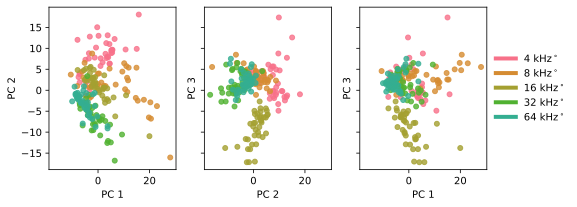

In [226]:
#Xr = np.vstack([t[:, frames_pre_stim + 1:frames_pre_stim+15].mean(axis=1) for t in trials]).T

# or take the max
Xr = np.vstack([t[:, frames_pre_stim:frames_pre_stim+20].max(axis=1) for t in trials]).T

# or the baseline-corrected mean
#Xr = np.vstack([t[:, frames_pre_stim:frames_pre_stim+15].mean(axis=1) - t[:, 0:frames_pre_stim].mean(axis=1) for t in trials]).T


Xr_sc = z_score(Xr)
pca = PCA(n_components=15)
Xp = pca.fit_transform(Xr_sc.T).T

#projections = [(0, 1), (0, 2), (0, 3), (0, 4), (0,5)]
#projections = [(1, 0), (1, 2), (1, 3), (1, 4), (1,5)]
#projections = [(2, 0), (2, 1), (2, 3), (2, 4), (2,5)]
projections = [(0, 1), (1, 2), (0, 2)]

fig, axes = plt.subplots(1, len(projections), figsize=[9, 3], sharey='row', sharex='row')
for ax, proj in zip(axes, projections):
    for t, t_type in enumerate(trial_types):
        x = Xp[proj[0], t_type_ind[t]]
        y = Xp[proj[1], t_type_ind[t]]
        ax.scatter(x, y, c=pal[t], s=25, alpha=0.8)
        ax.set_xlabel('PC {}'.format(proj[0]+1))
        ax.set_ylabel('PC {}'.format(proj[1]+1))

add_orientation_legend(axes[len(projections)-1])

Trial Averaged PCA: First average all trials of each type together, concatenate the trial averages, and then apply PCA to the resulting matrix.

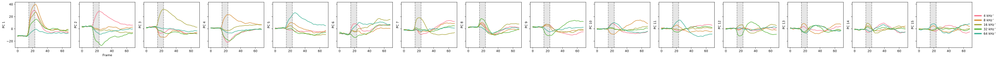

In [250]:
trial_averages = []

for ind in t_type_ind:
    ind = list(ind)
    i = 0
    for indeces in ind :
        if i == 0 :
            sum = trials[indeces]
            i = i + 1
        else :
            sum = sum + trials[indeces]
    mean = sum / len(ind)
    trial_averages.append(mean)
Xa = np.hstack(trial_averages)

n_components = 15
Xa = z_score(Xa) #Xav_sc = center(Xav)
pca = PCA(n_components=n_components)
Xa_p = pca.fit_transform(Xa.T).T

numComponents = 15 #set how many to plot
fig, axes = plt.subplots(1, numComponents, figsize=[50, 2.8], sharey='row')
for comp in range(numComponents):
    ax = axes[comp]
    for kk, type in enumerate(trial_types):
        x = Xa_p[comp, kk * trial_size :(kk+1) * trial_size]
        x = gaussian_filter1d(x, sigma=1)
        ax.plot(np.linspace(0,len(x), len(x)), x, c=pal[kk])
        #ax.errorbar(np.linspace(0,len(x), len(x)), x, yerr=np.std(x), c=pal[kk], elinewidth=.5)
    add_stim_to_plot(ax)
    ax.set_ylabel('PC {}'.format(comp+1))
add_orientation_legend(axes[numComponents-1])
axes[1].set_xlabel('Frame')
#sns.despine(fig=fig, right=True, top=True)
plt.tight_layout(rect=[0, 0, 0.9, 1])

Next, determine which units (neurons) PCA combines to obtain the above components. Recall, every component is just a linear combination of neurons in the population (a vector which assigns a weight to each neuron). We can ask which units feature more prominently in a given component as a way to spot neurons with interesting behavior.

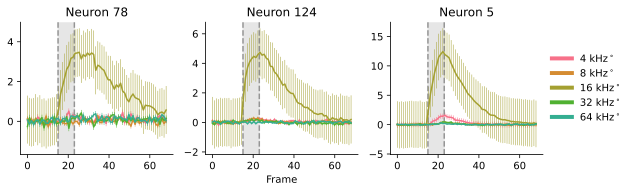

In [234]:
# find the indices of the three largest elements of the eigenvector of interest
component_of_interest = 3 #set ev of interest

units = np.abs(pca.components_[component_of_interest-1, :].argsort())[::-1][0:3]

f, axes = plt.subplots(1, 3, figsize=[10, 2.8], sharey=False,
                       sharex=True)
for ax, unit in zip(axes, units):
    ax.set_title('Neuron {}'.format(unit))
    for t, ind in enumerate(t_type_ind):
        ind = list(ind)
        x = np.zeros((trials[0].shape[1]))
        k = 0
        for indeces in ind :
            x = np.add(x, trials[indeces][unit, :])
            k = k + 1
        x = x/k
        ax.errorbar(np.linspace(0,len(x), len(x)), x, yerr=np.std(x), c=pal[t], elinewidth=.5)
        #sns.lineplot(x,
                   #ax=ax,
                   #err_style='band',
                   #ci=95,
                   #color=pal[t])
for ax in axes:
    add_stim_to_plot(ax)
axes[1].set_xlabel('Frame')
sns.despine(fig=f, right=True, top=True)
add_orientation_legend(axes[2])

Below, we examine the 3D latent trajectories. The dot represents the beginning of the trajectory, solid lines indicate that the stimulus is being presented, whereas dotted lines depict time points before and after stimulus presentation. Colors represent tones, as before.

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or R

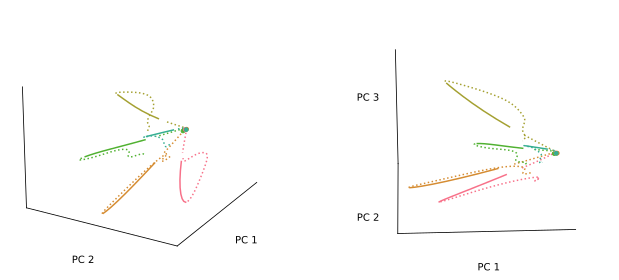

In [216]:
# prepare trial averages
trial_averages = []
for ind in t_type_ind:
    ind = list(ind)
    i = 0
    for indeces in ind :
        if i == 0 :
            sum = trials[indeces]
            i = i + 1
        else :
            sum = sum + trials[indeces]
    mean = sum / len(ind)
    trial_averages.append(mean)
#for ind in t_type_ind:
    #trial_averages.append(np.array(trials)[ind].mean(axis=0))
Xa = np.hstack(trial_averages)

# standardize and apply PCA
Xa = z_score(Xa) 
pca = PCA(n_components=3)
Xa_p = pca.fit_transform(Xa.T).T

# pick the components corresponding to the x, y, and z axes
component_x = 0
component_y = 1
component_z = 2

# create a boolean mask so we can plot activity during stimulus as 
# solid line, and pre and post stimulus as a dashed line
stim_mask = ~np.logical_and(np.arange(trial_size) >= frames_pre_stim,
               np.arange(trial_size) < (trial_size-frames_post_stim))

# utility function to clean up and label the axes
def style_3d_ax(ax):
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_zticks([])
    ax.xaxis.pane.fill = False
    ax.yaxis.pane.fill = False
    ax.zaxis.pane.fill = False
    ax.xaxis.pane.set_edgecolor('w')
    ax.yaxis.pane.set_edgecolor('w')
    ax.zaxis.pane.set_edgecolor('w')
    ax.set_xlabel('PC 1')
    ax.set_ylabel('PC 2')
    ax.set_zlabel('PC 3')

sigma = 3 # smoothing amount

# set up a figure with two 3d subplots, so we can have two different views
fig = plt.figure(figsize=[10, 4])
ax1 = fig.add_subplot(1, 2, 1, projection='3d')
ax2 = fig.add_subplot(1, 2, 2, projection='3d')
axs = [ax1, ax2]

for ax in axs:
    for t, t_type in enumerate(trial_types):

        # for every trial type, select the part of the component
        # which corresponds to that trial type:
        x = Xa_p[component_x, t * trial_size :(t+1) * trial_size]
        y = Xa_p[component_y, t * trial_size :(t+1) * trial_size]
        z = Xa_p[component_z, t * trial_size :(t+1) * trial_size]
        
        # apply some smoothing to the trajectories
        x = gaussian_filter1d(x, sigma=sigma)
        y = gaussian_filter1d(y, sigma=sigma)
        z = gaussian_filter1d(z, sigma=sigma)

        # use the mask to plot stimulus and pre/post stimulus separately
        z_stim = z.copy()
        z_stim[stim_mask] = np.nan
        z_prepost = z.copy()
        z_prepost[~stim_mask] = np.nan

        ax.plot(x, y, z_stim, c = pal[t])
        ax.plot(x, y, z_prepost, c=pal[t], ls=':')
        
        # plot dots at initial point
        ax.scatter(x[0], y[0], z[0], c=pal[t], s=14)
        
        # make the axes a bit cleaner
        style_3d_ax(ax)
        
# specify the orientation of the 3d plot        
ax1.view_init(elev=22, azim=30)
ax2.view_init(elev=22, azim=87)
plt.tight_layout()

Now, animate the trajectories above.

In [139]:
# apply some smoothing to the trajectories
for c in range(Xa_p.shape[0]):
    Xa_p[c, :] =  gaussian_filter1d(Xa_p[c, :], sigma=sigma)

# create the figure
fig = plt.figure(figsize=[9, 9]); plt.close()
ax = fig.add_subplot(1, 1, 1, projection='3d')

def animate(i):
    
    ax.clear() # clear up trajectories from previous iteration
    style_3d_ax(ax)
    ax.view_init(elev=22, azim=30)

    for t, t_type in enumerate(trial_types):
    
        x = Xa_p[component_x, t * trial_size :(t+1) * trial_size][0:i]
        y = Xa_p[component_y, t * trial_size :(t+1) * trial_size][0:i]
        z = Xa_p[component_z, t * trial_size :(t+1) * trial_size][0:i]

        stim_mask = ~np.logical_and(np.arange(z.shape[0]) >= frames_pre_stim,
                     np.arange(z.shape[0]) < (trial_size-frames_post_stim))

        z_stim = z.copy()
        z_stim[stim_mask] = np.nan
        z_prepost = z.copy()
        z_prepost[~stim_mask] = np.nan
        
        ax.plot(x, y, z_stim, c = pal[t])
        ax.plot(x, y, z_prepost, c=pal[t], ls=':')

    ax.set_xlim(( -50, 50))
    ax.set_ylim((-50, 50))
    ax.set_zlim((-25, 25))

    return []


anim = animation.FuncAnimation(fig, animate,
                               frames=88, interval=50, 
                               blit=True)

HTML(anim.to_jshtml(default_mode='once'))


Trial-Concatenated PCA: Stack all the trials (order doesn't matter). Result is C×TK array (number of components by number of time points times number of trials). Performs the dimensionality reduction at the level of single trials, so we get an idea of trial-to-trial variability in the reduction obtained. Fully unsupervised but sensitive to noise

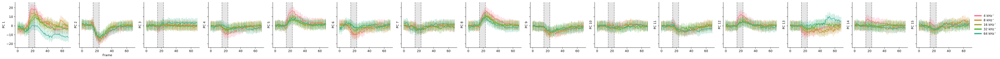

In [246]:
Xl = np.hstack(trials)
Xl = z_score(Xl)
pca = PCA(n_components=15)
Xl_p = pca.fit_transform(Xl.T).T

gt = {comp : {t_type : [] for t_type in trial_types} for comp in range(n_components)}

for comp in range(n_components):
    for i, t_type in enumerate(trial_types):
        t = Xl_p[comp, trial_size * i: trial_size * (i + 1)]
        #gt[comp][trial_types[t_type - 1]].append(t)
        gt[comp][t_type].append(t)

for comp in range(n_components):
    for t_type in trial_types:
        gt[comp][t_type] = np.vstack(gt[comp][t_type])


numComponents = 15
f, axes = plt.subplots(1, numComponents, figsize=[50, 2.8], sharey=True, sharex=True)
for comp in range(numComponents):
    ax = axes[comp]
    ax.set_ylabel('PC {}'.format(comp + 1))
    for t, t_type in enumerate(trial_types):
        #sns.lineplot(gt[comp][t_type].squeeze(), ax=ax,
                   #err_style='band',
                   #ci=95,
                   #color=pal[t])
        ax.errorbar(np.linspace(0,len(gt[comp][t_type].squeeze()), len(gt[comp][t_type].squeeze())), gt[comp][t_type].squeeze(), yerr=np.std(x), c=pal[t], elinewidth=.5)
    add_stim_to_plot(ax)
    #ax.set_ylabel('PC {}'.format(comp + 1))
axes[1].set_xlabel('Frame')
sns.despine(right=True, top=True)
add_orientation_legend(axes[numComponents - 1])

Averaged-concatenated (hybrid) PCA. Fit PCA on concatenated trial averages, like trial-averaged form, and then apply to the matrix of concatenated trials, like in the trial-concatenated form.

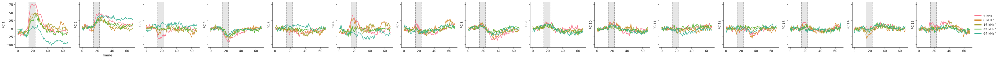

In [247]:
# fit PCA on trial averages
trial_averages = []
for ind in t_type_ind:
    ind = list(ind)
    i = 0
    for indeces in ind :
        if i == 0 :
            sum = trials[indeces]
            i = i + 1
        else :
            sum = sum + trials[indeces]
    mean = sum / len(ind)
    trial_averages.append(mean)
Xav = np.hstack(trial_averages)

ss = StandardScaler(with_mean=True, with_std=True)
Xav_sc = ss.fit_transform(Xav.T).T
pca = PCA(n_components=15) 
pca.fit(Xav_sc.T) # only call the fit method

projected_trials = []
for trial in trials:
    # scale every trial using the same scaling applied to the averages 
    trial = ss.transform(trial.T).T
    # project every trial using the pca fit on averages
    proj_trial = pca.transform(trial.T).T
    projected_trials.append(proj_trial)

gt = {comp: {t_type: [] for t_type in trial_types}
      for comp in range(n_components)}

for comp in range(n_components):
    for i, t_type in enumerate(trial_types):
        t = projected_trials[i][comp, :]
        #gt[comp][t_type].append(t)
        gt[comp][t_type].append(t)


numComponents = 15
f, axes = plt.subplots(1, numComponents, figsize=[50, 2.8], sharey=True, sharex=True)
for comp in range(numComponents):
    ax = axes[comp]
    ax.set_ylabel('PC {}'.format(comp + 1))
    for i, t_type in enumerate(trial_types):
        sns.lineplot(gt[comp][t_type][0], ax=ax, color = pal[i],
                   err_style='band',
                   ci=95)
    add_stim_to_plot(ax)
axes[1].set_xlabel('Frame')
sns.despine(right=True, top=True)
add_orientation_legend(axes[numComponents - 1])

Use hybrid averaged-concatenated PCA to plot a dot per trial at each time point.

In [249]:
# import the animation and the HTML module to create and render the animation
from matplotlib import animation 
from IPython.display import HTML

# smooth the single projected trials 
for i in range(len(projected_trials)):
    for c in range(projected_trials[0].shape[0]):
        projected_trials[i][c, :] = gaussian_filter1d(projected_trials[i][c, :], sigma=1)

# for every time point (imaging frame) get the position in PCA space of every trial
pca_frame = []
for t in range(trial_size):
    # projected data for all trials at time t 
    Xp = np.hstack([tr[:, None, t] for tr in projected_trials]).T
    pca_frame.append(Xp)
    
subspace = (1,0) # pick the subspace given by the 1st and 2nd components

    
# set up the figure
fig, ax = plt.subplots(1, 1, figsize=[6, 6]); plt.close()
ax.set_xlim(( -100, 100))
ax.set_ylim((-100, 100))
ax.set_xlabel('PC 1')
ax.set_xticks([-100, 0, 100])
ax.set_yticks([-100, 0, 100])
ax.set_ylabel('PC 2')
sns.despine(fig=fig, top=True, right=True)

# generate empty scatter plot to be filled by data at every time point
scatters = []
for t, t_type in enumerate(trial_types):
    scatter, = ax.plot([], [], 'o', lw=2, color=pal[t])
    scatters.append(scatter)

# red dot to indicate when stimulus is being presented
stimdot, = ax.plot([], [], 'o', c='r', markersize=35, alpha=0.5)

text     = ax.text(55, 60, 'Stimulus OFF', fontdict={'fontsize':14})

# annotate with stimulus and time information
#text     = ax.text(6.3, 9, 'Stimulus OFF \nt = {:.2f}'.format(time[0]), fontdict={'fontsize':14})

# this is the function to be called at every animation frame
def animate(i):
    for t, t_type in enumerate(trial_types):
        # find the x and y position of all trials of a given type
        x = pca_frame[i][t_type_ind[t], subspace[0]]
        y = pca_frame[i][t_type_ind[t], subspace[1]]
        # update the scatter
        scatters[t].set_data(x, y)
        
    # update stimulus and time annotation
    if (i >= frames_pre_stim) and (i < (trial_size-frames_post_stim)):
        stimdot.set_data(80, 80)
        text.set_text('Stimulus ON')
    else:
        stimdot.set_data([], [])
        text.set_text('Stimulus OFF')
    return (scatter,)

# generate the animation
anim = animation.FuncAnimation(fig, animate, 
                               frames=len(pca_frame), interval=80, 
                               blit=False)

HTML(anim.to_jshtml()) # render animation

Below are 3D trajectories of individual trials. Smoothed projected trials from hybrid averaged-concatenated PCA.

In [143]:
# set up a dictionary to color each line
col = {trial_types[i] : pal[i] for i in range(len(trial_types))}


fig = plt.figure(figsize=[9, 9]); plt.close()
ax = fig.add_subplot(1, 1, 1, projection='3d')

def animate(i):
    
    ax.clear()
    style_3d_ax(ax)
    ax.view_init(elev=22, azim=30)
    for t, (trial, t_type) in enumerate(zip(projected_trials[0:200], trial_type[0:200])):
        
        x = trial[component_x, :][0:i]
        y = trial[component_y, :][0:i]
        z = trial[component_z, :][0:i]
        
        stim_mask = ~np.logical_and(np.arange(z.shape[0]) >= frames_pre_stim,
                     np.arange(z.shape[0]) < (trial_size-frames_pre_stim))

        z_stim = z.copy()
        z_stim[stim_mask] = np.nan
        z_prepost = z.copy()
        z_prepost[~stim_mask] = np.nan
        
        ax.plot(x, y, z_stim, c = col[trial_types[t_type-1]])
        ax.plot(x, y, z_prepost, c=col[trial_types[t_type-1]], ls=':')

    ax.set_xlim(( -100, 100))
    ax.set_ylim((-100, 100))
    ax.set_zlim((-100, 100))


    ax.view_init(elev=22, azim=30)

    return []

anim = animation.FuncAnimation(fig, animate, frames=len(pca_frame), interval=50,blit=True)

HTML(anim.to_jshtml(default_mode='once'))